# MultiModal Embedding Models Exploration

## Gather Multimodal data

In [1]:
import requests

# Images and Text
url1='http://farm3.staticflickr.com/2519/4126738647_cc436c111b_z.jpg'
cap1='A motorcycle sits parked across from a herd of livestock'

url2='http://farm3.staticflickr.com/2046/2003879022_1b4b466d1d_z.jpg'
cap2='Motorcycle on platform to be worked on in garage'

url3='https://www.pacificcoast.com/on/demandware.static/-/Sites-pcf-master-catalog/default/dw9396be22/images/Pillows/prod-image_NP_HotelTOD_2_954.jpg'
cap3='a white pillow on a bed laying against other pillows'

img1 = {
  'flickr_url': url1,
  'caption': cap1,
  'image_path' : '../data/raw/images/motorcycle_1.jpg'
}

img2 = {
    'flickr_url': url2,
    'caption': cap2,
    'image_path' : '../data/raw/images/motorcycle_2.jpg'
}

img3 = {
    'flickr_url' : url3,
    'caption': cap3,
    'image_path' : '../data/raw/images/pillow_1.jpg'
}

# download images
imgs = [img1, img2, img3]
for img in imgs:
    data = requests.get(img['flickr_url']).content
    with open(img['image_path'], 'wb') as f:
        f.write(data)

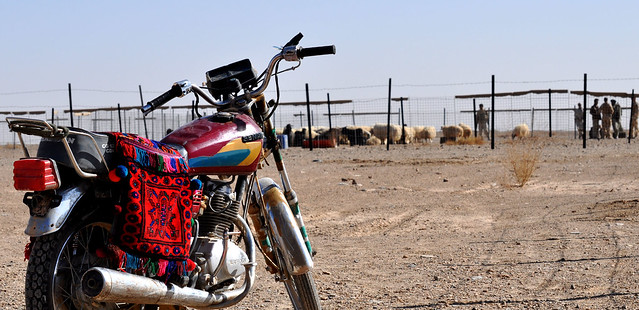

'A motorcycle sits parked across from a herd of livestock'

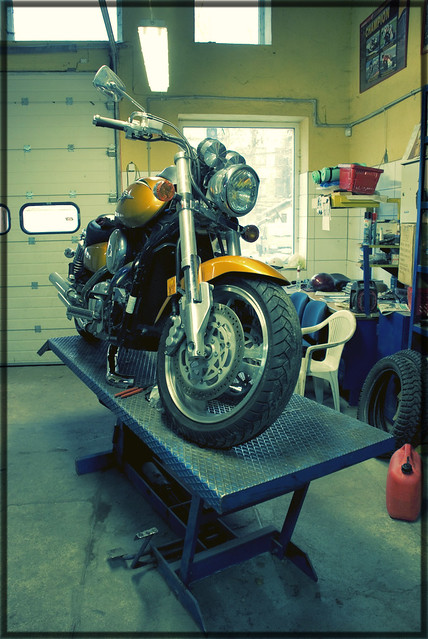

'Motorcycle on platform to be worked on in garage'

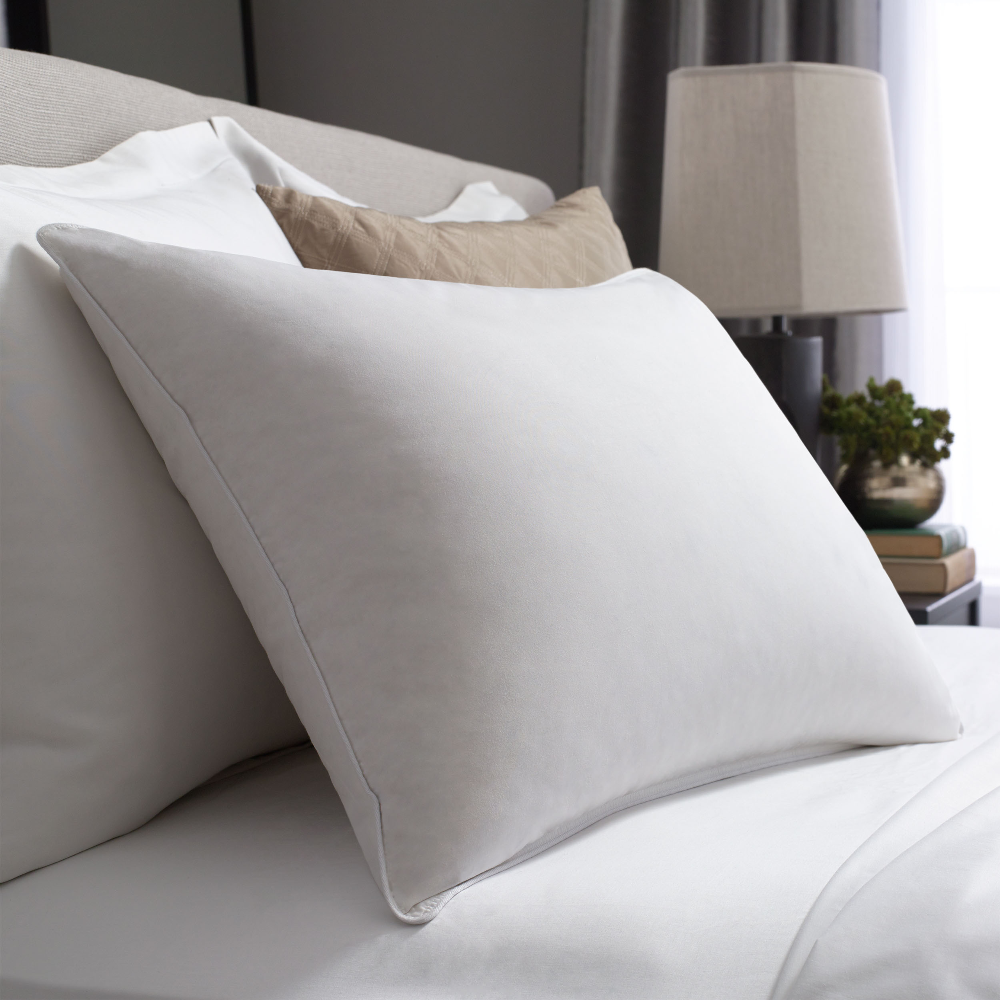

'a white pillow on a bed laying against other pillows'

In [2]:
from PIL import Image
from IPython.display import display

for img in [img1, img2, img3]:
    image = Image.open(img['image_path'])
    caption = img['caption']
    display(image)
    display(caption)
    print()

## Compute Embedding

In [3]:
import numpy as np
from umap import UMAP
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances, pairwise_distances
import pandas as pd
from tqdm import tqdm
from transformers import BridgeTowerProcessor, BridgeTowerModel
import torch
import matplotlib.pyplot as plt
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D  # Necessary for 3D plotting
import plotly.graph_objs as go

/home/zalasyu/.cache/pypoetry/virtualenvs/multimodal-chatbot-gKQKVxne-py3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
processor = BridgeTowerProcessor.from_pretrained("BridgeTower/bridgetower-base-itm-mlm")

model = BridgeTowerModel.from_pretrained("BridgeTower/bridgetower-base-itm-mlm")
model.to(device)
model.eval()

BridgeTowerModel(
  (cross_modal_text_transform): Linear(in_features=768, out_features=768, bias=True)
  (cross_modal_image_transform): Linear(in_features=768, out_features=768, bias=True)
  (token_type_embeddings): Embedding(2, 768)
  (vision_model): BridgeTowerVisionModel(
    (visual): BridgeTowerVisionTransformer(
      (embeddings): BridgeTowerVisionEmbeddings(
        (patch_embedding): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
        (position_embedding): Embedding(325, 768)
      )
      (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (transformer): BridgeTowerTransformer(
        (resblocks): ModuleList(
          (0-11): 12 x BridgeTowerResidualAttention(
            (attn): MultiheadAttention(
              (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
            )
            (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
            (mlp): ModuleDict(
              (c

# Create Embeddings

In [5]:
embeddings_list = list()

# Load images
images = [Image.open(img['image_path']) for img in [img1, img2, img3]]


for image in tqdm(images):
    encoding = processor(images=image, text=img['caption'], return_tensors="pt", padding=True)
    # Move tensors in 'encoding' to the device
    encoding = {key: value.to(device) for key, value in encoding.items()}
    with torch.no_grad():
        outputs = model(**encoding)
        print(outputs)
        embeddings = outputs.pooler_output
        print(embeddings.shape)
        embeddings_list.append(embeddings.cpu().numpy())

 33%|███▎      | 1/3 [00:00<00:00,  2.74it/s]

BridgeTowerModelOutput(text_features=tensor([[[-0.0505,  0.2419, -0.0234,  ..., -0.0564,  0.2754,  0.3102],
         [ 0.8346,  0.1324, -0.2265,  ..., -0.3923, -0.4541,  0.7637],
         [-0.1870,  0.9293,  1.1489,  ..., -0.1740,  0.0275,  1.1488],
         ...,
         [-0.1804, -0.5790,  0.7264,  ...,  0.3214, -0.0468,  0.0749],
         [ 0.1781, -0.5232,  0.7632,  ..., -0.3454,  0.3382,  0.1033],
         [-0.0536,  0.2382, -0.0267,  ..., -0.0520,  0.2773,  0.3036]]],
       device='cuda:0'), image_features=tensor([[[ 0.7884,  0.4857, -0.8771,  ..., -1.7842, -0.8169, -2.3230],
         [ 1.2313,  0.2256, -0.4405,  ..., -1.8041, -0.7195, -2.6696],
         [ 1.3729,  0.2851, -0.1917,  ..., -2.1170, -0.3535, -1.2069],
         ...,
         [ 1.3703,  0.2958, -0.1715,  ..., -2.1188, -0.3342, -1.1816],
         [ 0.6484,  0.1984, -0.4406,  ..., -1.3167, -0.7813, -2.7938],
         [ 0.8544, -0.0540, -0.7683,  ..., -1.7762, -0.7272, -2.5523]]],
       device='cuda:0'), pooler_output=

100%|██████████| 3/3 [00:00<00:00,  4.65it/s]

BridgeTowerModelOutput(text_features=tensor([[[-0.0149,  0.1451,  0.0604,  ..., -0.0471,  0.2504,  0.2576],
         [ 0.1253,  0.2672, -0.2118,  ..., -0.2483, -0.3131,  0.3761],
         [-0.4020,  0.0419,  0.4007,  ..., -0.3864, -0.4106,  0.6395],
         ...,
         [-0.1276, -1.0447,  0.8313,  ...,  0.0341, -0.2840,  0.0304],
         [ 0.2802, -1.0633,  0.4637,  ..., -0.2039,  0.2137, -0.0476],
         [-0.0157,  0.1428,  0.0627,  ..., -0.0427,  0.2515,  0.2565]]],
       device='cuda:0'), image_features=tensor([[[-0.2566, -0.3881, -0.2864,  ...,  0.3064,  1.2282,  1.9955],
         [ 0.8195,  0.2316,  0.4764,  ...,  1.2481,  0.3403,  0.4886],
         [ 0.1401, -0.6239,  1.4018,  ...,  0.9071,  0.9583,  1.0844],
         ...,
         [ 1.1043,  0.2915, -0.5870,  ...,  0.3508, -1.0058, -0.5043],
         [ 1.6060,  0.3821, -0.4553,  ...,  0.0391, -0.7251, -0.8187],
         [ 0.9309,  0.5751, -0.8793,  ..., -0.0237, -0.4559, -0.4944]]],
       device='cuda:0'), pooler_output=

In [6]:
print(f"Here is the first embedding: {embeddings_list[0]}")
print(f"The length of the embedding is: {len(embeddings_list[0][0])}")

Here is the first embedding: [[ 0.08160079  0.85036427  0.02066107 ... -0.01687745 -0.99351215
   0.9960121 ]]
The length of the embedding is: 1536


In [7]:
# Vertically stack the embeddings
embeddings = np.vstack(embeddings_list)
print(f"Here is the first embedding: {embeddings[0]}")
print(f"The length of the embedding is: {len(embeddings[0])}")

Here is the first embedding: [ 0.08160079  0.85036427  0.02066107 ... -0.01687745 -0.99351215
  0.9960121 ]
The length of the embedding is: 1536


In [8]:
# Normalize the embeddings using L2 norm
embeddings_normalized = normalize(embeddings, norm='l2')
print(f"Embeddings Normalized from first embedding: {embeddings_normalized[0]}")

Embeddings Normalized from first embedding: [ 0.00335199  0.03493121  0.00084871 ... -0.00069329 -0.04081143
  0.04091412]


## Compute Similarity Measures

In [9]:
cosine_sim_matrix = cosine_similarity(embeddings_normalized)
print(f"Here is the cosine similarity matrix: {cosine_sim_matrix[0]}")

Here is the cosine similarity matrix: [ 1.          0.96111387 -0.22966018]


In [10]:
euclidean_dist_matrix = euclidean_distances(embeddings_normalized)
print(f"Here is the euclidean distance matrix: {euclidean_dist_matrix[0]}")

Here is the euclidean distance matrix: [0.        0.2788763 1.568222 ]


In [11]:
p=3
minkwoski_dist_matrix = pairwise_distances(embeddings_normalized, metric='minkowski', p=p)
print(f"Here is the minkowski distance matrix: {minkwoski_dist_matrix[0]}")

Here is the minkowski distance matrix: [0.         0.12636454 0.57089594]


## Visualize Embeddings with Bigger Dataset

In [12]:
from datasets import load_dataset

ds = load_dataset("nlphuji/flickr30k")

In [13]:
# Display the first few rows of the dataset
print(ds['test'])

Dataset({
    features: ['image', 'caption', 'sentids', 'split', 'img_id', 'filename'],
    num_rows: 31014
})


['A man is looking intently at something in his hands while another man, who is slightly behind him, is smoking and holding a can of something in his hand.',
 'Two men, dressed in black, are standing on a sidewalk in an urban area while one lights a cigarette.',
 'Man lighting a cigarette on the right and man looking at the phone on the left.',
 'A man in a gray stocking hat lights a cigarette while holding a pop.',
 'Two men standing on a corner, one is smoking.']

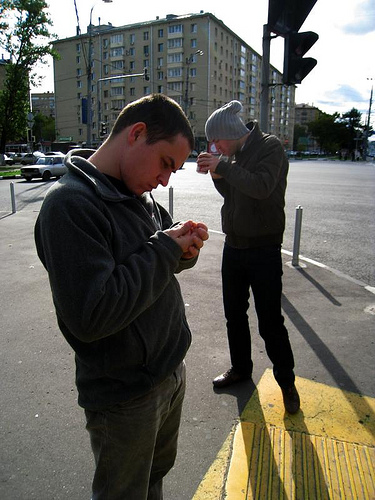

['Two little girls, playing together in the sand.',
 'Two little girls playing with sand on the beach.',
 'Two little girls play in the sand at the beach.',
 'Two young children play on a sandy beach.',
 'Two young children play in the sand.']

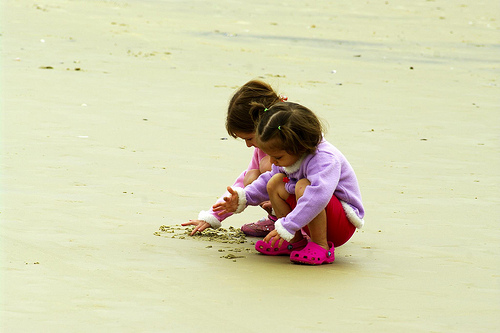

['The cheerleading squad for a professional basketball team is performing a routine.',
 'The New York Knicks dancers performing a routine at Madison Square Garden.',
 'Group of cheerleaders in white dress dancing on a basketball court.',
 'The New York Knicks cheerleaders are performing during a game.',
 'A cheerleading squad performing at a New York Knicks game.']

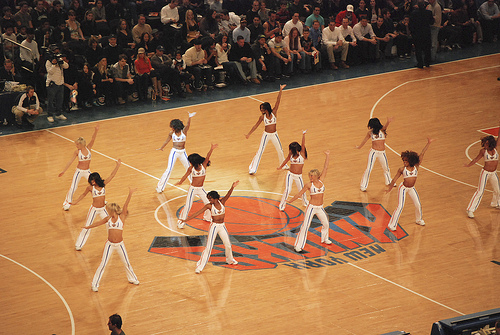

['A man in khakis pants is lying on concrete and looking into the sky.',
 'A businessman in a tan suit sleeps on the sidewalk near a building.',
 'Using his bag as a pillow, a man takes a nap in the city.',
 'A man rests on a concrete bench using his bag as a pillow.',
 'A balding man laying outside on his bag.']

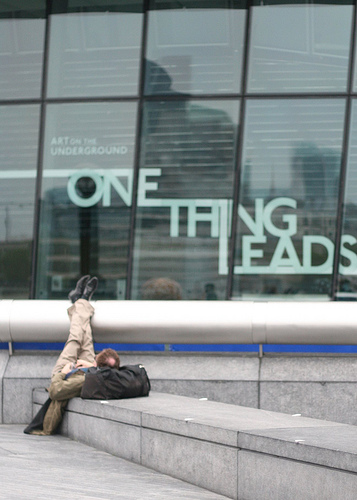

['One woman gives another woman a pedicure in a small apartment, as yet another woman watches.',
 'A woman in a pink top and black long shorts is getting her nails done by a lady in red.',
 'A woman is having her foot examined by another woman in a run-down building.',
 'Woman wearing pink top is getting a pedicure.',
 '3 people in a small hut or house.']

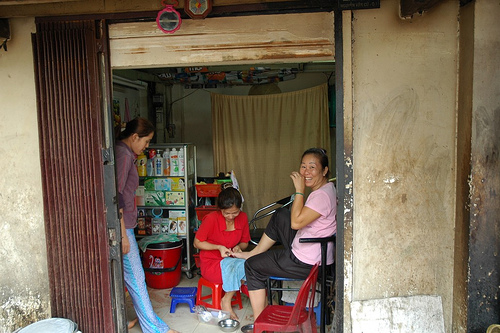

['It looks like quite a sweaty, smelly dog pile over one little rugby ball, but the boys in blue seem to want it more.',
 'Two bald men, laying on a field, tussle over a ball with other men during a sporting event.',
 'Rugby players fighting over the ball on the ground with bald heads in an official game.',
 'Several soccer players in defensive position( s ) on the ground during a game.',
 'Soccer players in a wrestling match.']

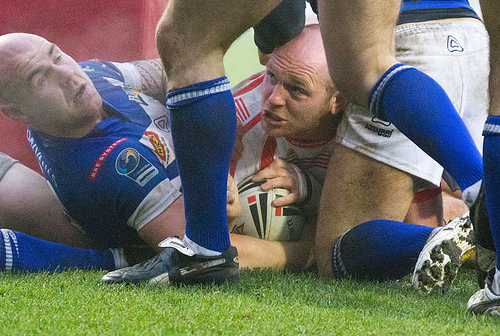

In [14]:
from IPython.display import display
# Select a subset of the dataset
subset = ds['test'].shuffle(seed=42).select(range(10000))

# Display a few samples
for i, item in enumerate(subset):
    display(item['caption'])
    display(item['image'])
    if i >= 5:
        break 

In [15]:
# Extract the image and caption from the dataset
images = [img['image'] for img in subset]
print(len(images))
captions = [img['caption'] for img in subset]
print(len(captions))

10000
10000


In [16]:

images_list = list()
concatenated_captions = list()

for image, caption_list in zip(images, captions):
    # Concatenate all captions into one string
    concatenated_caption = ' '.join(caption_list)
    images_list.append(image)
    concatenated_captions.append(concatenated_caption)

# Generate embeddings by batch
embeddings_list = list()

# Set batch size
batch_size = 20

# Initialize a list to store embeddings
embeddings_list = []

for i in tqdm(range(0, len(images_list), batch_size)):
    batch_images = images_list[i:i + batch_size]
    batch_captions = concatenated_captions[i:i + batch_size]
    
    # Preprocess inputs
    encoding = processor(text=batch_captions, images=batch_images, return_tensors="pt", padding=True)
    # Move tensors in 'encoding' to the device
    encoding = {key: value.to(device) for key, value in encoding.items()}
    
        
    with torch.no_grad():
        outputs = model(**encoding)
        # Extract embeddings (pooler_output has shape [batch_size, 1526])
        embeddings = outputs.pooler_output
        embeddings_list.append(embeddings)

  0%|          | 0/500 [00:00<?, ?it/s]

100%|██████████| 500/500 [09:18<00:00,  1.12s/it]


In [17]:
# Concatenate and normalize the embeddings
embeddings_tensor = torch.cat(embeddings_list, dim=0)
embeddings_array = embeddings_tensor.cpu().numpy()
embeddings_normalized = normalize(embeddings_array, norm='l2')

In [18]:
umap_reducer = UMAP(n_components=3, metric="cosine", random_state=42)
embeddings_umap = umap_reducer.fit_transform(embeddings_normalized)

/home/zalasyu/.cache/pypoetry/virtualenvs/multimodal-chatbot-gKQKVxne-py3.12/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [12]:
from sklearn.cluster import SpectralClustering

# Decide on the number of clusters
num_clusters = 8  # Adjust as needed

# Apply k-means clustering
spectral= SpectralClustering(n_clusters=num_clusters, affinity='rbf', assign_labels='kmeans', random_state=42, n_jobs=-1)
cluster_labels = spectral.fit_predict(embeddings_normalized)

In [13]:
# Prepare data for Plotly
df = pd.DataFrame({'Dimension 1': embeddings_umap[:, 0], 'Dimension 2': embeddings_umap[:, 1], 'Dimension 3': embeddings_umap[:, 2], 'Cluster': cluster_labels, 'Caption': concatenated_captions})

In [14]:
# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=df['Dimension 1'], y=df['Dimension 2'], z=df['Dimension 3'], mode='markers', marker=dict(color=df['Cluster'], size=2), text=df['Caption'])])

fig.update_layout(
    title='Interactive 3D UMAP Projection',
    scene=dict(
        xaxis_title='Dimension 1',
        yaxis_title='Dimension 2',
        zaxis_title='Dimension 3'
    ),
    width=1300,
    height=1300,
)

# Show the plot
fig.show()

### t-SNE Visualization

In [15]:
from sklearn.manifold import TSNE

In [20]:
# Initialize the t-SNE model
tsne = TSNE(n_components=3, random_state=42, perplexity=100, n_iter=1000)

In [21]:
# Reduce the dimensionality of the embeddings
embeddings_tsne = tsne.fit_transform(embeddings_normalized)

/home/zalasyu/.cache/pypoetry/virtualenvs/multimodal-chatbot-gKQKVxne-py3.12/lib/python3.12/site-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning:

'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.



In [22]:
# Prepare data for Plotly
df_tsne = pd.DataFrame({'Dimension 1': embeddings_tsne[:, 0], 'Dimension 2': embeddings_tsne[:, 1], 'Dimension 3': embeddings_tsne[:, 2], 'Cluster': cluster_labels})

In [23]:
# Create a 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=df_tsne['Dimension 1'], y=df_tsne['Dimension 2'], z=df_tsne['Dimension 3'], mode='markers', marker=dict(color=df['Cluster'], size=2), text=df['Cluster'])])

fig.update_layout(
    title='Interactive 3D UMAP Projection',
    scene=dict(
        xaxis_title='Dimension 1',
        yaxis_title='Dimension 2',
        zaxis_title='Dimension 3'
    ),
    width=1300,
    height=600,
)

# Show the plot
fig.show()